In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import Descriptors

In [2]:
df = pd.read_csv('qm9.csv')

In [3]:
dataframe = df.sample(n=20000, random_state=8)
dataframe.reset_index(drop=True, inplace=True)

In [4]:
dataframe_2 = df.iloc[0:20000, :]

In [5]:
dataframe_3 = df.sample(frac=0.2, random_state=8)

In [6]:
vals = [Descriptors.CalcMolDescriptors(Chem.MolFromSmiles(mol)) for index, mol in dataframe['smiles'].items()]

In [7]:
descriptor_df = pd.DataFrame(vals)


merged_df = pd.concat([dataframe, descriptor_df], axis=1)

merged_df.head()

,mol_id,smiles,A,B,C,mu,alpha,homo,lumo,gap,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,gdb_127681,Cn1c(=O)c(=O)[nH]cn1,2.55371,1.86773,1.08606,4.8744,68.00,-0.2373,-0.0482,0.1891,...,0,0,0,0,0,0,0,0,0,0
1,gdb_47147,O=C1OCC=C1C1CN1,3.44826,1.35217,1.05024,4.3361,73.60,-0.2412,-0.0468,0.1944,...,0,0,0,0,0,0,0,0,0,0
2,gdb_76994,OC1C(C=O)C2CC12O,2.89020,1.43152,1.21195,2.1218,68.28,-0.2455,-0.0404,0.2051,...,0,0,0,0,0,0,0,0,0,0
3,gdb_71188,OC12CN3C(C13)C2C#C,2.69334,1.64281,1.33705,1.6756,73.64,-0.2324,0.0299,0.2622,...,0,0,0,1,0,0,0,0,0,0
4,gdb_129229,N=C1NN=NC(C=O)=C1,3.97426,1.18913,0.91527,3.5299,73.45,-0.2559,-0.1027,0.1531,...,0,0,0,0,0,0,0,0,0,0


In [8]:
df_skipp = merged_df.copy()
df_skipp.isna().sum()

mol_id              0
smiles              0
A                   0
B                   0
C                   0
                   ..
fr_thiazole         0
fr_thiocyan         0
fr_thiophene        0
fr_unbrch_alkane    0
fr_urea             0
Length: 227, dtype: int64

In [9]:
from rdkit import Chem
from mordred import Calculator, descriptors

# create descriptor calculator with all descriptors
calc = Calculator(descriptors, ignore_3D=True)

print(len(calc.descriptors))

print(len(Calculator(descriptors, ignore_3D=True, version="1.0.0")))

# calculate multiple molecule
mols = [Chem.MolFromSmiles(smi) for smi in dataframe['smiles']]

# as pandas
desk = calc.pandas(mols)

1613
1612


100%|███████████████████████████████████████████████████████████████████| 20000/20000 [12:20<00:00, 27.01it/s]


In [10]:
desk_df = pd.DataFrame(desk)
updated_merged_df = pd.concat([merged_df, desk_df], axis=1)

updated_merged_df.head()

,mol_id,smiles,A,B,C,mu,alpha,homo,lumo,gap,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,gdb_127681,Cn1c(=O)c(=O)[nH]cn1,2.55371,1.86773,1.08606,4.8744,68.00,-0.2373,-0.0482,0.1891,...,8.876126,37.975562,127.038176,9.074155,82,11,42.0,47.0,4.083333,2.055556
1,gdb_47147,O=C1OCC=C1C1CN1,3.44826,1.35217,1.05024,4.3361,73.60,-0.2412,-0.0468,0.1944,...,9.064274,58.079349,125.047678,7.815480,83,9,48.0,57.0,2.583333,1.972222
2,gdb_76994,OC1C(C=O)C2CC12O,2.89020,1.43152,1.21195,2.1218,68.28,-0.2455,-0.0404,0.2051,...,10.173553,62.696580,128.047344,7.532197,82,9,54.0,71.0,3.895833,1.930556
3,gdb_71188,OC12CN3C(C13)C2C#C,2.69334,1.64281,1.33705,1.6756,73.64,-0.2324,0.0299,0.2622,...,10.676670,65.372909,121.052764,7.565798,77,8,62.0,86.0,3.006944,1.819444
4,gdb_129229,N=C1NN=NC(C=O)=C1,3.97426,1.18913,0.91527,3.5299,73.45,-0.2559,-0.1027,0.1531,...,8.606851,37.313444,124.038511,9.541424,88,9,40.0,43.0,3.472222,2.166667


In [11]:
# Importing libraries
import numpy as np
import pandas as pd
import plotly.express as px
from scipy import stats
from plotly.subplots import make_subplots
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
import plotly.graph_objects as go
colors = ['#082040', '#175073', '#3285A6', '#B8D0D9', '#6CC5D9']

In [12]:
updated_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Columns: 1840 entries, mol_id to mZagreb2
dtypes: bool(2), float64(862), int64(428), object(548)
memory usage: 280.5+ MB


In [13]:
updated_merged_df.replace(0, np.nan, inplace=True)
df_skipp = updated_merged_df.copy()
df_skipp.isna().sum()

mol_id       0
smiles       0
A            0
B            0
C            0
            ..
WPol        12
Zagreb1      1
Zagreb2      1
mZagreb1     0
mZagreb2     1
Length: 1840, dtype: int64

In [14]:
# Removing complete duplicates
df_final = df_skipp.drop_duplicates()

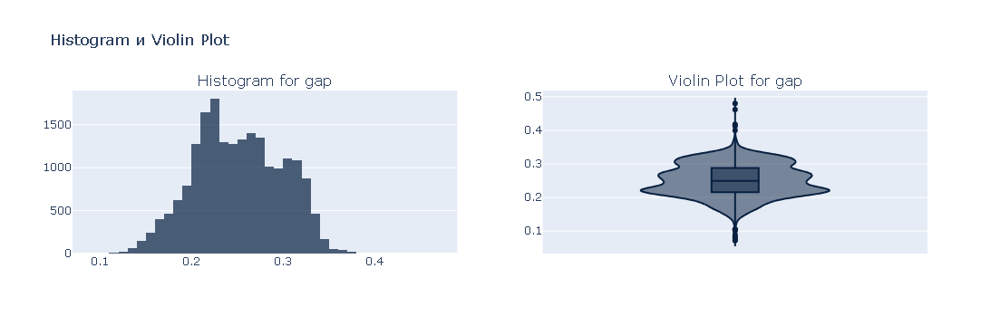

In [15]:
fig = make_subplots(rows=1, cols=2, subplot_titles=['Histogram for gap', 'Violin Plot for gap'])

# Histogram
hist_fig = px.histogram(df_final, x="gap", nbins = 60,
                 color_discrete_sequence = colors,
                 opacity = 0.7)

fig.add_trace(hist_fig['data'][0], row=1, col=1) # Adding a graph indicating the location

# Violin plot
violin_fig = px.violin(df_final, y="gap", color_discrete_sequence = colors, box = True)
fig.add_trace(violin_fig['data'][0], row=1, col=2) # Adding a graph indicating the locatio

# Setting up the layout
fig.update_layout(showlegend=False, title_text="Histogram и Violin Plot")

# Graph display
fig.show()

In [16]:
def detect_outliers_zscore(data, threshold=3.0):
    """
    Detect outliers using Z-score method.

    Parameters:
        data (array-like): Input data.
        threshold (float): Z-score threshold for identifying outliers.

    Returns:
        outliers (array-like): Array containing the indices of outlier data points.
    """
    mean = np.mean(data)
    std_dev = np.std(data)
    z_scores = [(x - mean) / std_dev for x in data]
    outliers = np.where(np.abs(z_scores) > threshold)[0]
    return outliers

# Example usage:
outliers = detect_outliers_zscore(df_final['gap'])
print("Indices of outliers:", outliers)
print("Outlier values:", [df_final['gap'].iloc[i] for i in outliers])

Indices of outliers: [ 1681  3682  3916  4165  6687  6890  7896  9573 10248 11779 12887 14554
 17101 17914]
Outlier values: [0.1038, 0.462, 0.4177, 0.074, 0.1052, 0.1015, 0.3997, 0.0901, 0.0801, 0.083, 0.0714, 0.105, 0.4128, 0.4802]


In [17]:
def detect_outliers_iqr(data, threshold=1.5):
    """
    Detect outliers using the Interquartile Range (IQR) method.

    Parameters:
        data (array-like): Input data.
        threshold (float): Multiplier for the IQR to determine the outlier cutoff.

    Returns:
        outliers (array-like): Array containing the indices of outlier data points.
    """
    quartile_1, quartile_3 = np.percentile(data, [25, 75])
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (threshold * iqr)
    upper_bound = quartile_3 + (threshold * iqr)
    outliers = np.where((data < lower_bound) | (data > upper_bound))[0]
    return outliers

# Example usage:
outliers = detect_outliers_iqr(df_final['gap'])
print("Indices of outliers:", outliers)
print("Outlier values:", [df_final['gap'].iloc[i] for i in outliers])

Indices of outliers: [ 1681  3682  3916  4165  6687  6890  7896  9573 10248 11779 12887 14554
 17101 17914]
Outlier values: [0.1038, 0.462, 0.4177, 0.074, 0.1052, 0.1015, 0.3997, 0.0901, 0.0801, 0.083, 0.0714, 0.105, 0.4128, 0.4802]


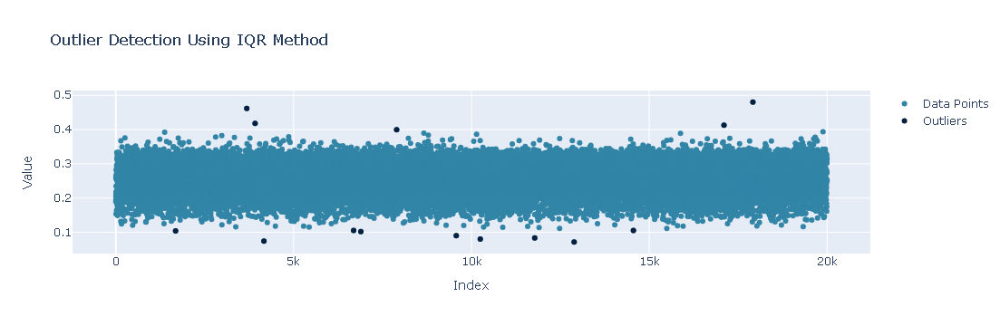

In [18]:
# Detect outliers
outliers = detect_outliers_iqr(df_final['gap'])

# Scatter plot
fig = go.Figure()

# Plot all data points
fig.add_trace(go.Scatter(x=np.arange(len(df_final['gap'])), y=df_final['gap'], mode='markers', name='Data Points', marker=dict(color=colors[2])))

# Highlight outliers
fig.add_trace(go.Scatter(x=outliers, y=[df_final['gap'].iloc[i] for i in outliers], mode='markers', marker=dict(color=colors[0]), name='Outliers'))

# Add layout
fig.update_layout(title='Outlier Detection Using IQR Method',
                  xaxis_title='Index',
                  yaxis_title='Value')

# Show plot
fig.show()

In [19]:
filtered_data = df_final.drop(df_final.index[outliers])
filtered_data.head()

,mol_id,smiles,A,B,C,mu,alpha,homo,lumo,gap,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,gdb_127681,Cn1c(=O)c(=O)[nH]cn1,2.55371,1.86773,1.08606,4.8744,68.00,-0.2373,-0.0482,0.1891,...,8.876126,37.975562,127.038176,9.074155,82.0,11.0,42.0,47.0,4.083333,2.055556
1,gdb_47147,O=C1OCC=C1C1CN1,3.44826,1.35217,1.05024,4.3361,73.60,-0.2412,-0.0468,0.1944,...,9.064274,58.079349,125.047678,7.815480,83.0,9.0,48.0,57.0,2.583333,1.972222
2,gdb_76994,OC1C(C=O)C2CC12O,2.89020,1.43152,1.21195,2.1218,68.28,-0.2455,-0.0404,0.2051,...,10.173553,62.696580,128.047344,7.532197,82.0,9.0,54.0,71.0,3.895833,1.930556
3,gdb_71188,OC12CN3C(C13)C2C#C,2.69334,1.64281,1.33705,1.6756,73.64,-0.2324,0.0299,0.2622,...,10.676670,65.372909,121.052764,7.565798,77.0,8.0,62.0,86.0,3.006944,1.819444
4,gdb_129229,N=C1NN=NC(C=O)=C1,3.97426,1.18913,0.91527,3.5299,73.45,-0.2559,-0.1027,0.1531,...,8.606851,37.313444,124.038511,9.541424,88.0,9.0,40.0,43.0,3.472222,2.166667


In [20]:
filtered_data = filtered_data.loc[:, ~filtered_data.columns.duplicated()]

In [46]:
columns = filtered_data.iloc[::,2::].columns
columns_to_remove = []
for i in columns:
    if filtered_data[i].isna().all():
        columns_to_remove.append(i)
    if filtered_data[i].dtype ==  'object':
        columns_to_remove.append(i)
        
    

In [47]:
columns_to_remove

['NumRadicalElectrons',
 'SMR_VSA8',
 'SlogP_VSA12',
 'SlogP_VSA7',
 'SlogP_VSA9',
 'EState_VSA11',
 'VSA_EState10',
 'fr_C_S',
 'fr_N_O',
 'fr_SH',
 'fr_azide',
 'fr_azo',
 'fr_barbitur',
 'fr_benzodiazepine',
 'fr_diazo',
 'fr_hdrzine',
 'fr_hdrzone',
 'fr_isocyan',
 'fr_isothiocyan',
 'fr_nitro_arom',
 'fr_nitro_arom_nonortho',
 'fr_nitroso',
 'fr_phos_acid',
 'fr_phos_ester',
 'fr_prisulfonamd',
 'fr_sulfide',
 'fr_sulfonamd',
 'fr_sulfone',
 'fr_thiazole',
 'fr_thiocyan',
 'fr_thiophene',
 'VR3_A',
 'nB',
 'nS',
 'nP',
 'nCl',
 'nBr',
 'nI',
 'ATS0s',
 'ATS1s',
 'ATS2s',
 'ATS3s',
 'ATS4s',
 'ATS5s',
 'ATS6s',
 'ATS7s',
 'ATS8s',
 'AATS3dv',
 'AATS4dv',
 'AATS5dv',
 'AATS6dv',
 'AATS7dv',
 'AATS8dv',
 'AATS3d',
 'AATS4d',
 'AATS5d',
 'AATS6d',
 'AATS7d',
 'AATS8d',
 'AATS0s',
 'AATS1s',
 'AATS2s',
 'AATS3s',
 'AATS4s',
 'AATS5s',
 'AATS6s',
 'AATS7s',
 'AATS8s',
 'AATS3Z',
 'AATS4Z',
 'AATS5Z',
 'AATS6Z',
 'AATS7Z',
 'AATS8Z',
 'AATS3m',
 'AATS4m',
 'AATS5m',
 'AATS6m',
 'AATS7m',

In [48]:
filtered = filtered_data.drop(columns=columns_to_remove)

In [49]:
filtered.head()

,mol_id,smiles,A,B,C,mu,alpha,homo,lumo,gap,...,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb2
0,gdb_127681,Cn1c(=O)c(=O)[nH]cn1,2.55371,1.86773,1.08606,4.8744,68.00,-0.2373,-0.0482,0.1891,...,NaN,8.876126,37.975562,127.038176,9.074155,82.0,11.0,42.0,47.0,2.055556
1,gdb_47147,O=C1OCC=C1C1CN1,3.44826,1.35217,1.05024,4.3361,73.60,-0.2412,-0.0468,0.1944,...,7.655864,9.064274,58.079349,125.047678,7.815480,83.0,9.0,48.0,57.0,1.972222
2,gdb_76994,OC1C(C=O)C2CC12O,2.89020,1.43152,1.21195,2.1218,68.28,-0.2455,-0.0404,0.2051,...,8.598773,10.173553,62.696580,128.047344,7.532197,82.0,9.0,54.0,71.0,1.930556
3,gdb_71188,OC12CN3C(C13)C2C#C,2.69334,1.64281,1.33705,1.6756,73.64,-0.2324,0.0299,0.2622,...,9.121618,10.676670,65.372909,121.052764,7.565798,77.0,8.0,62.0,86.0,1.819444
4,gdb_129229,N=C1NN=NC(C=O)=C1,3.97426,1.18913,0.91527,3.5299,73.45,-0.2559,-0.1027,0.1531,...,NaN,8.606851,37.313444,124.038511,9.541424,88.0,9.0,40.0,43.0,2.166667


In [55]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5) 
db_filled = imputer.fit_transform(filtered.iloc[::,2::]) 


In [60]:
df_imputed = pd.DataFrame(db_filled, columns=filtered.columns[2::])

In [72]:
filtered.reset_index(drop=True, inplace=True)

In [75]:
data = pd.concat([filtered.iloc[::,:2], df_imputed], axis=1)

In [76]:
data

,mol_id,smiles,A,B,C,mu,alpha,homo,lumo,gap,...,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb2
0,gdb_127681,Cn1c(=O)c(=O)[nH]cn1,2.55371,1.86773,1.08606,4.8744,68.00,-0.2373,-0.0482,0.1891,...,5.761342,8.876126,37.975562,127.038176,9.074155,82.0,11.0,42.0,47.0,2.055556
1,gdb_47147,O=C1OCC=C1C1CN1,3.44826,1.35217,1.05024,4.3361,73.60,-0.2412,-0.0468,0.1944,...,7.655864,9.064274,58.079349,125.047678,7.815480,83.0,9.0,48.0,57.0,1.972222
2,gdb_76994,OC1C(C=O)C2CC12O,2.89020,1.43152,1.21195,2.1218,68.28,-0.2455,-0.0404,0.2051,...,8.598773,10.173553,62.696580,128.047344,7.532197,82.0,9.0,54.0,71.0,1.930556
3,gdb_71188,OC12CN3C(C13)C2C#C,2.69334,1.64281,1.33705,1.6756,73.64,-0.2324,0.0299,0.2622,...,9.121618,10.676670,65.372909,121.052764,7.565798,77.0,8.0,62.0,86.0,1.819444
4,gdb_129229,N=C1NN=NC(C=O)=C1,3.97426,1.18913,0.91527,3.5299,73.45,-0.2559,-0.1027,0.1531,...,6.679780,8.606851,37.313444,124.038511,9.541424,88.0,9.0,40.0,43.0,2.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19981,gdb_105954,CCC12C3C1N1C3C21C,3.04181,1.46107,1.16675,2.0755,81.69,-0.2040,0.0705,0.2745,...,10.150699,11.448547,70.760216,121.089149,6.054457,74.0,8.0,74.0,114.0,1.715278
19982,gdb_37075,C1CC23COCC2(C1)N3,3.19648,1.61472,1.35340,3.2252,77.29,-0.2345,0.0679,0.3024,...,8.917177,10.137888,63.561809,125.084064,6.254203,71.0,8.0,60.0,80.0,1.812500
19983,gdb_33216,c1cnc([nH]1)CCCO,5.34642,0.65843,0.63888,2.3018,78.38,-0.2163,0.0333,0.2497,...,6.259581,8.199464,49.466505,126.079313,6.635753,99.0,6.0,38.0,40.0,2.250000
19984,gdb_106144,CCC12C3CN1C2(C)C3,2.48144,1.52019,1.21884,1.5653,86.28,-0.2257,0.0886,0.3143,...,9.407140,10.839640,66.496797,123.104799,5.595673,75.0,8.0,64.0,92.0,1.812500


In [78]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data.iloc[::,2::])

In [80]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(data_scaled)

PCA()

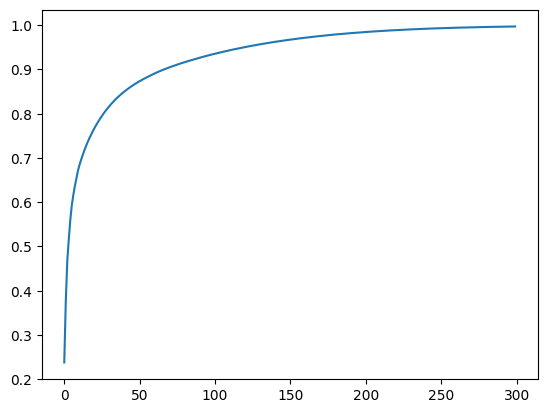

In [100]:
total_var = np.cumsum(pca.explained_variance_ratio_)
plt.plot(total_var)

In [88]:
pca = PCA(n_components=300, svd_solver='full', random_state=8)
pca.fit(data_scaled)

PCA(n_components=300, random_state=8, svd_solver='full')

In [94]:
components = pca.transform(data_scaled)

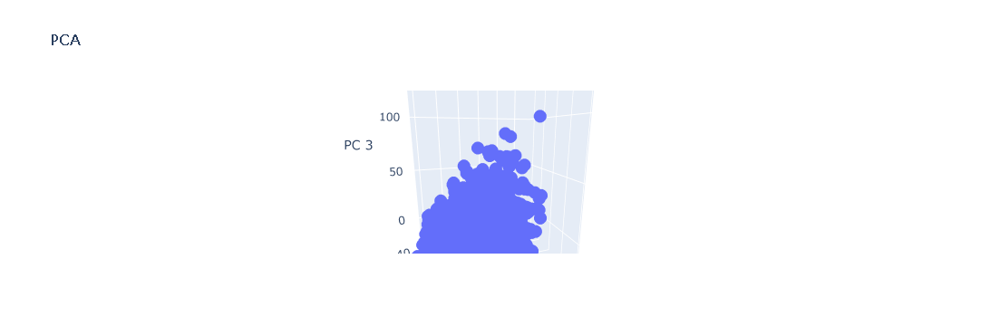

In [104]:
fig = px.scatter_3d(
    components, x=0, y=1, z=2,
    title=f'PCA',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

In [111]:
from sklearn.manifold import TSNE
data_embedded = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=50, random_state=8).fit_transform(data_scaled)

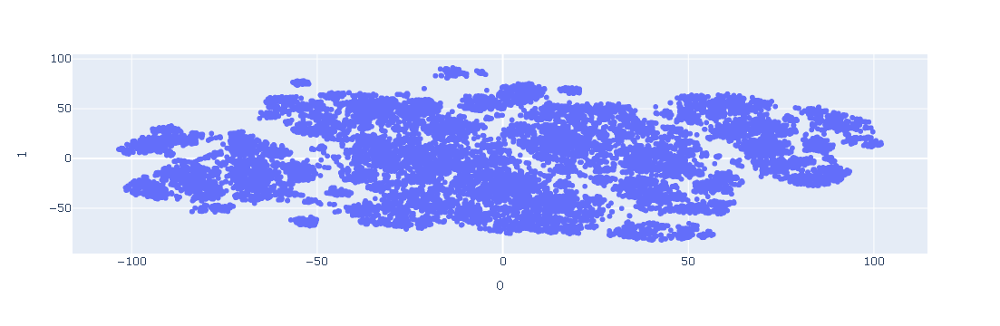

In [115]:
fig = px.scatter(data_embedded, x=0, y=1)
fig.show()

In [118]:
from sklearn.model_selection import train_test_split
X_train, X_test = train_test_split(data_embedded,test_size=0.2, random_state=8)

In [143]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=6, random_state=8, n_init="auto").fit(X_train)
kmeans_predicted = kmeans.predict(X_test)

In [ ]:
# from sklearn.model_selection import cross_val_score
# cross_val = cross_val_score(estimator=kmeans, X=data_embedded, y= kmeans_predicted, cv=5, scoring='neg_mean_squared_error')
# lin_cross_res = np.sqrt(-cross_val)
# print(f"Results: {lin_cross_res}")
# print(f"Mean: {lin_cross_res.mean()}")
# print(f"Std: {lin_cross_res.std()}")

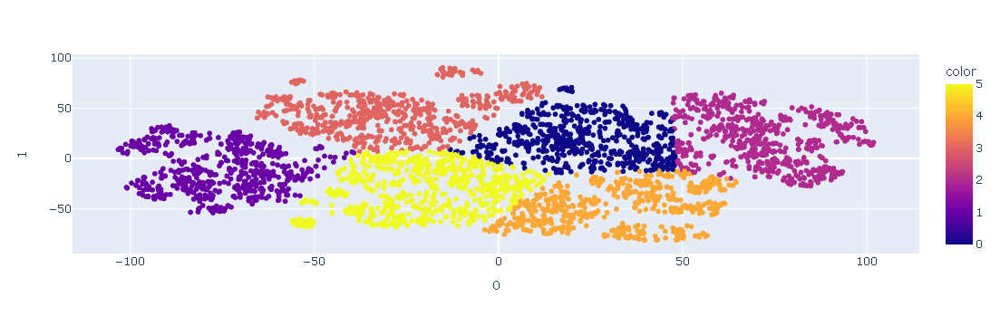

In [146]:
fig = px.scatter(X_test, x=0, y=1, color=kmeans_predicted)
fig.show()